# <u>**EEG NeuroImaging Analysis (EEGNIA)**</u>
by Derek Newman

* These exercises are designed to orient the user to the neuroimaging analysis process using EEG and Python environment.

### Exercises:
0. Introduction to Python
1. Introduction to Signal Processing with EEG
2. Preprocessing EEG signals
3. Complex Systems Analysis
  
  3.1. Criticality Metrics (Fractal, Synchrony, Chaos, Percolation)

  3.2. Information Theoretic Metrics

  3.3. Complexity Metrics
  

4. Statistical Analysis for neuroimaging
5. Machine Learning for neuroimaging

# 0. Introduction to Python

<u>Table of Contents</u>
1. Data types
2. Arrays and Matrices
3. Conditionals: If Statements and Boolean Algebra
4. Loops


# 1. Introduction to Signal Processing with EEG

<u>Table of Contents</u>
1. Environment Set up
2. Signals
3. Filtering
4. Frequency Analysis: Fourier


In [1]:
!pip install mne

In [2]:
#!pip install openneuro-py # (Accessiblity to openly available Neuroimaging data)

In [2]:
!pip install ipympl # A package to help visualization  of our data within this notebook

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 516.3/516.3 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 18.2 MB/s eta 0:00:00


In [3]:
# Import packages
import matplotlib.pyplot as plt # A visualization package for creating plots and graphs.
import numpy as np # A library for numerical computations and array manipulations.
import scipy as sp # A scientific computing library with functions for optimization, integration, and more.
import pandas as pd # A data analysis library with structures for handling and manipulating tabular data (known as DataFrames).
import seaborn as sb # A statistical visualization library for more sophisticated plots.
import mne # Import the package we just downlaoded
%matplotlib widget

In [15]:
# Run this to help with our visuals so we can click and play with them
from google.colab import output
output.enable_custom_widget_manager()

In [4]:
from mne.datasets import sample #EEGBCI, bst_resting (other dat sets)

# Load the sample dataset (this might take a few minutes)
data_path = sample.data_path()

In [5]:
data_path

PosixPath('/root/mne_data/MNE-sample-data')

In [6]:
import glob # We use Glob to scan directories [folders] we can also use 'os.join' from import os

In [7]:
# Let's examine the available data files
# Note MEG and EEG data are very similar and both are analyzed in the MNE environment.
glob.glob(f"{data_path}/MEG/sample/*.fif") # The '*' scans for any file within the directory, and addid '.fif' is for any file ending with .fif will be reported (these are Neuroimages)

['/root/mne_data/MNE-sample-data/MEG/sample/sample_audvis-meg-vol-7-fwd.fif',
 '/root/mne_data/MNE-sample-data/MEG/sample/sample_audvis-no-filter-ave.fif',
 '/root/mne_data/MNE-sample-data/MEG/sample/sample_audvis-meg-oct-6-meg-fixed-inv.fif',
 '/root/mne_data/MNE-sample-data/MEG/sample/sample_audvis-eeg-oct-6p-fwd.fif',
 '/root/mne_data/MNE-sample-data/MEG/sample/sample_audvis_ecg-eve.fif',
 '/root/mne_data/MNE-sample-data/MEG/sample/sample_audvis_filt-0-40_raw-eve.fif',
 '/root/mne_data/MNE-sample-data/MEG/sample/sample_audvis_ecg-proj.fif',
 '/root/mne_data/MNE-sample-data/MEG/sample/sample_audvis-meg-eeg-oct-6-meg-eeg-diagnoise-inv.fif',
 '/root/mne_data/MNE-sample-data/MEG/sample/sample_audvis-meg-vol-7-meg-inv.fif',
 '/root/mne_data/MNE-sample-data/MEG/sample/sample_audvis_raw.fif',
 '/root/mne_data/MNE-sample-data/MEG/sample/sample_audvis-meg-eeg-oct-6-meg-eeg-inv.fif',
 '/root/mne_data/MNE-sample-data/MEG/sample/sample_audvis_eog-proj.fif',
 '/root/mne_data/MNE-sample-data/MEG/

In [8]:
# Write in 'f-strings' format
raw_path = f"{data_path}/MEG/sample/sample_audvis_raw.fif"

# Load raw data
raw = mne.io.read_raw_fif(raw_path, preload=True)
# There are other forms of EEG files where there are other mne.io.read_filetype...

Opening raw data file /root/mne_data/MNE-sample-data/MEG/sample/sample_audvis_raw.fif...
    Read a total of 3 projection items:
        PCA-v1 (1 x 102)  idle
        PCA-v2 (1 x 102)  idle
        PCA-v3 (1 x 102)  idle
    Range : 25800 ... 192599 =     42.956 ...   320.670 secs
Ready.
Reading 0 ... 166799  =      0.000 ...   277.714 secs...


In [9]:
# Let's pull info from this raw data
raw.info

Measurement date,"December 03, 2002 19:01:10 GMT"
Experimenter,MEG
Participant,Unknown
Digitized points,146 points
Good channels,"203 Gradiometers, 102 Magnetometers, 9 Stimulus, 59 EEG, 1 EOG"
Bad channels,"MEG 2443, EEG 053"
EOG channels,EOG 061
ECG channels,Not available
Sampling frequency,600.61 Hz
Highpass,0.10 Hz
Lowpass,172.18 Hz


In [10]:
# The file has MEG and EEG data, let's just take the EEG
raw_eeg = raw.pick_types(meg=False, eeg=True)

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


In [11]:
# Check the info
raw_eeg.info

Measurement date,"December 03, 2002 19:01:10 GMT"
Experimenter,MEG
Participant,Unknown
Digitized points,146 points
Good channels,59 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,600.61 Hz
Highpass,0.10 Hz
Lowpass,172.18 Hz


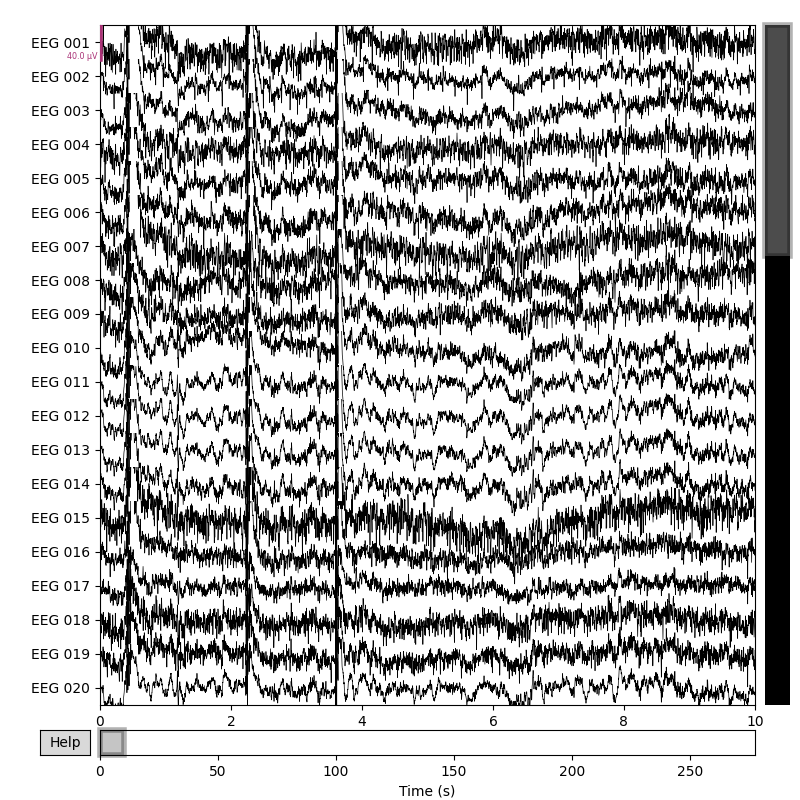

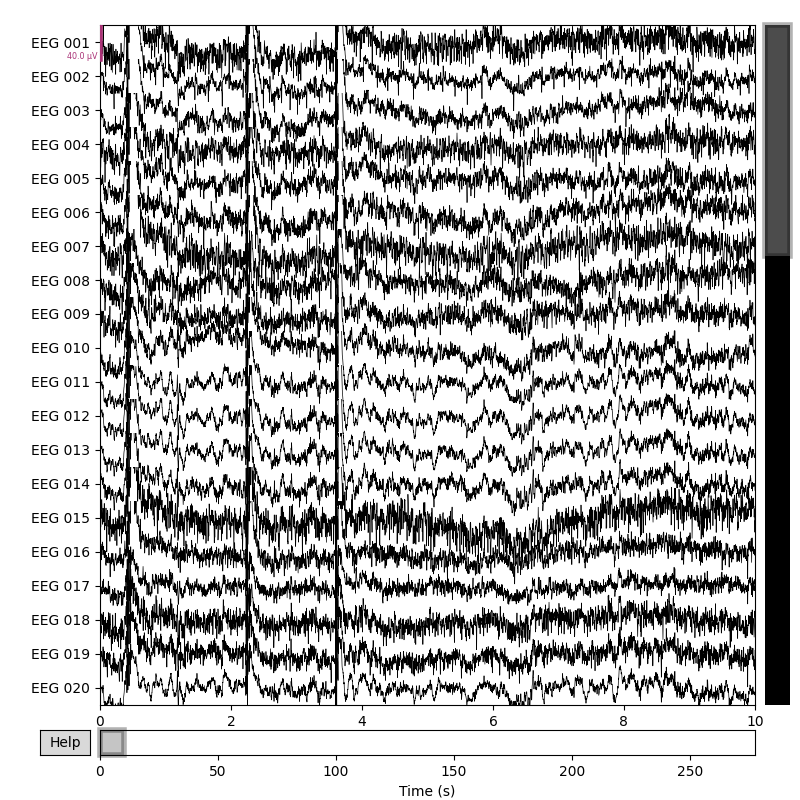

In [14]:
# Plot the raw data to visualize signals (time domain)
raw_eeg.plot() # We can also select attributes of this funciton like: n_channels=10, start=0, duration=5
plt.show()

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 3.410 (s)
Plotting power spectral density (dB=True).


<ipython-input-19-45326c65acdd>:3: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  raw_eeg.plot_psd()


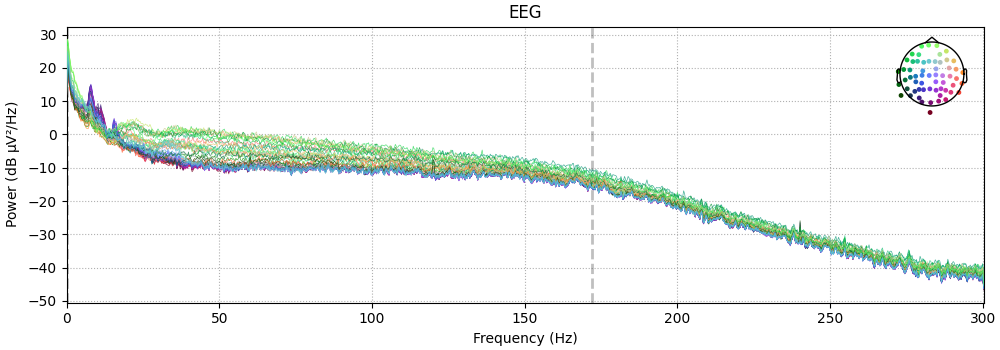

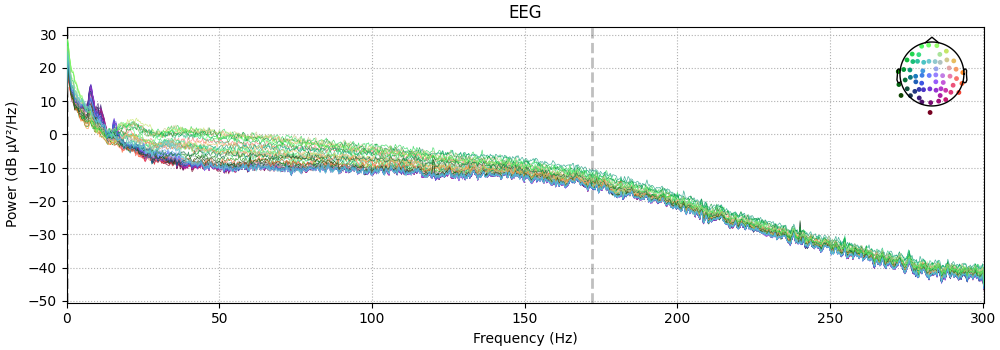

In [19]:
# Conversely we can look at the frequency domain, this below is called a Power Spectral Density Plot
# It is a way of visualizing signals as a summation of its component frequencies. On th Y axis we can see Power,  or Energy of the signal and the X axis are frequency
raw_eeg.plot_psd()
plt.show()

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 3.410 (s)
Plotting power spectral density (dB=True).


<ipython-input-20-2deee12d6971>:2: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  raw_eeg.plot_psd(fmax=100)


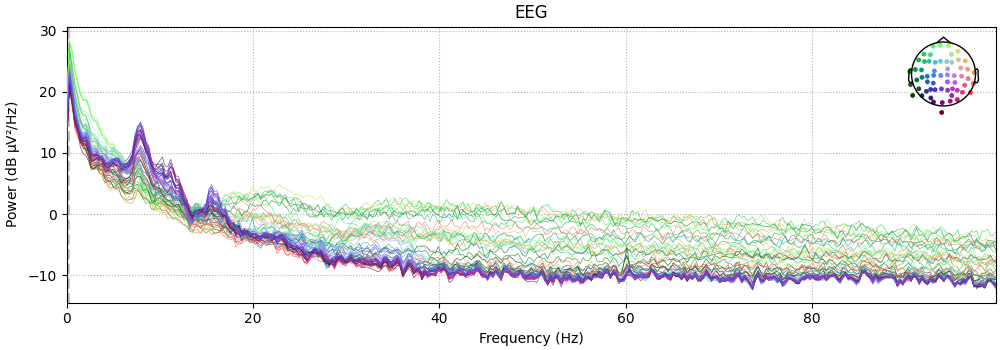

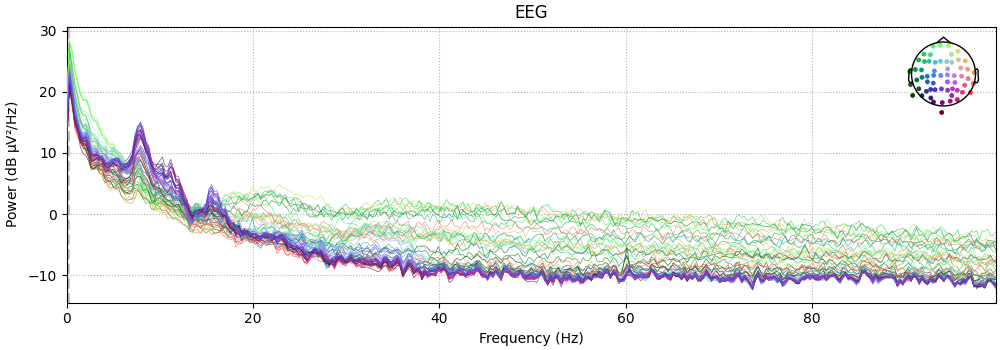

In [20]:
# Let's say we were not concerned with activity greater than 100 hz
raw_eeg.plot_psd(fmax=100)
plt.show()

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 3.410 (s)
Plotting power spectral density (dB=True).


<ipython-input-21-aa351320dc42>:2: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  raw_eeg.plot_psd(fmin= 5,fmax=20)


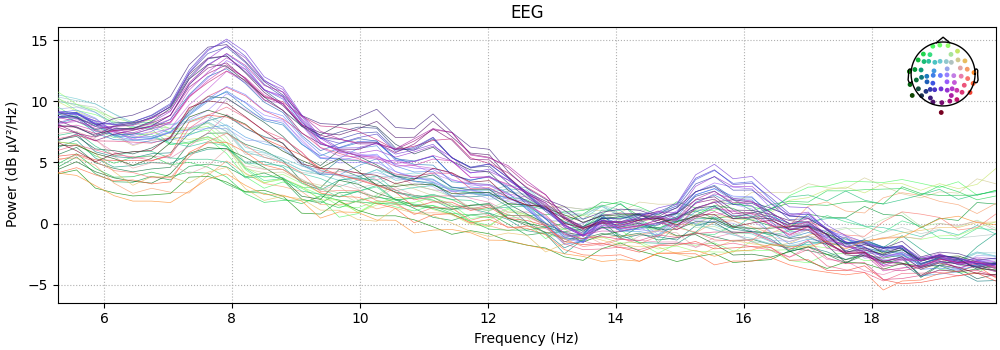

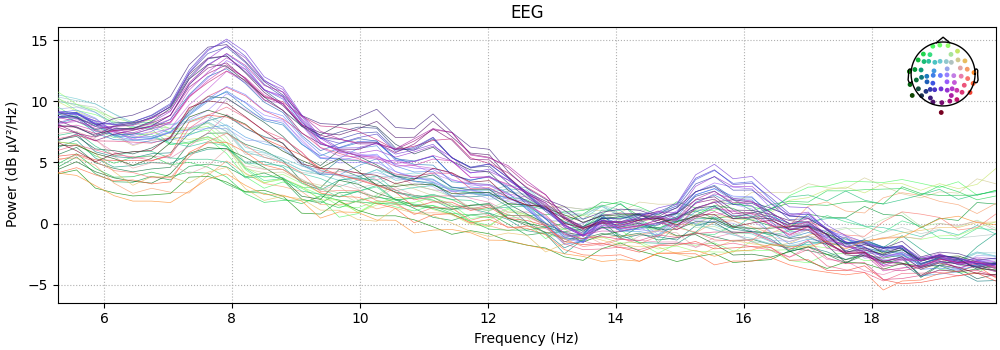

In [21]:
# Let's say we only wanted to see the activity greater than 5 hz but less than 20
raw_eeg.plot_psd(fmin= 5,fmax=20)
plt.show()

### Typed of Filters:
Let's say we were interested in slow activity (low frequency) or fast activity (high frquency) we can isolate that activity by filtering out the unwanted frequencies

1. Low-Pass Filter: Removes high-frequency noise by allowing only frequencies below a specific cutoff to pass.
2. High-Pass Filter: Eliminates low-frequency drifts by allowing only frequencies above a specific cutoff to pass.
3. Band-Pass Filter: Isolates frequencies within a specific range, useful for focusing on particular signal components like EEG bands.
4. Band-Stop (Notch) Filter: Rejects frequencies within a narrow range, commonly used to remove electrical noise (e.g., 60 Hz).

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1983 samples (3.302 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 3.410 (s)
Plotting power spectral density (dB=True).


<ipython-input-22-24975a26a99f>:5: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  raw_eeg.plot_psd(fmax=50)


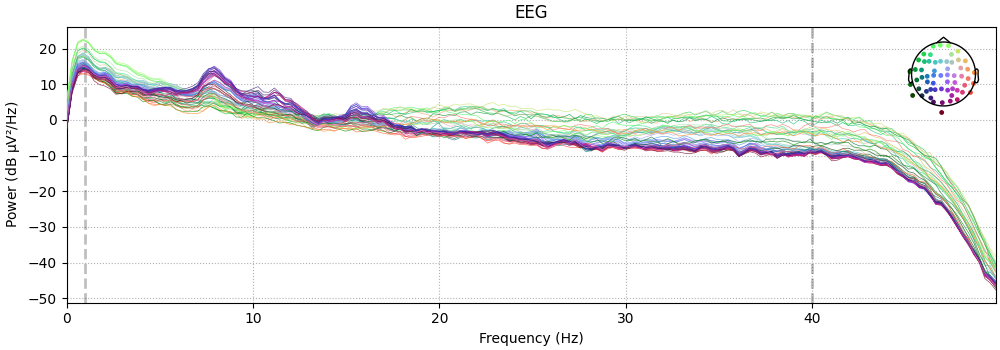

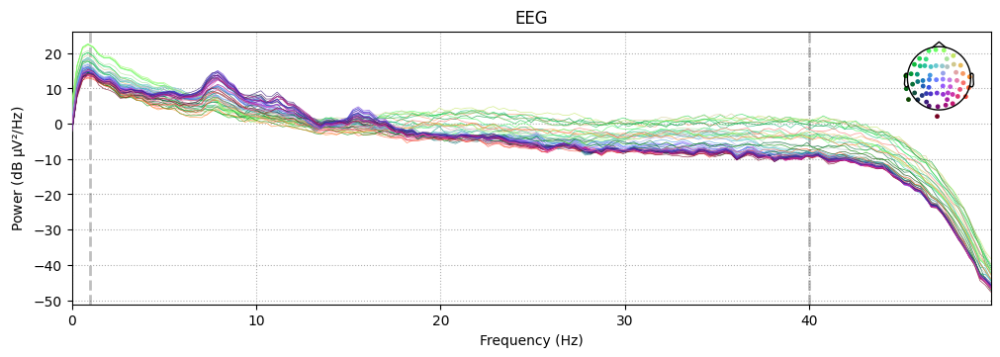

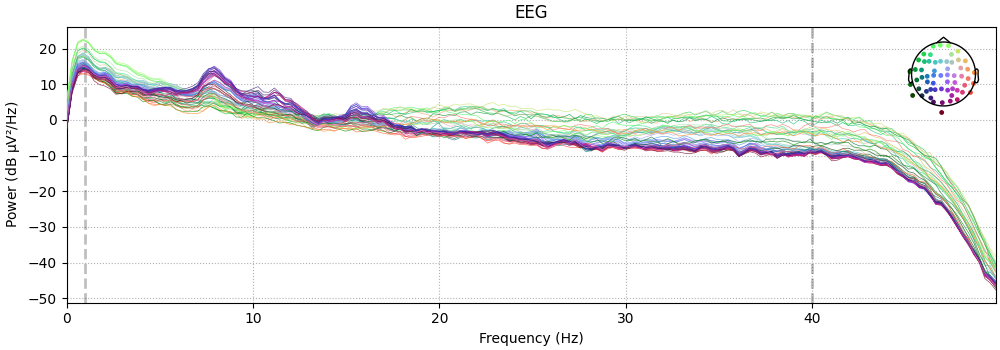

In [22]:
# Apply a bandpass filter between 1 and 40 Hz
test = raw_eeg.copy().filter(1, 40)

# View the PSD
test.plot_psd(fmax=50)

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 265 samples (0.441 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 3.410 (s)
Plotting power spectral density (dB=True).


<ipython-input-28-5a4ab69e533d>:5: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  raw_low.plot_psd(fmax=50)


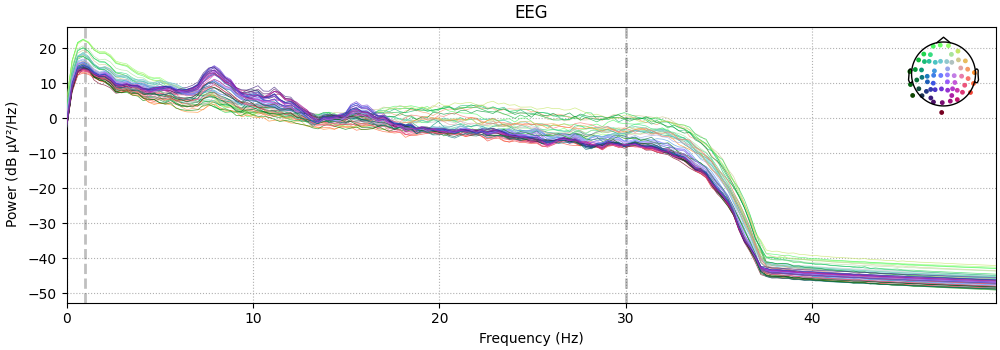

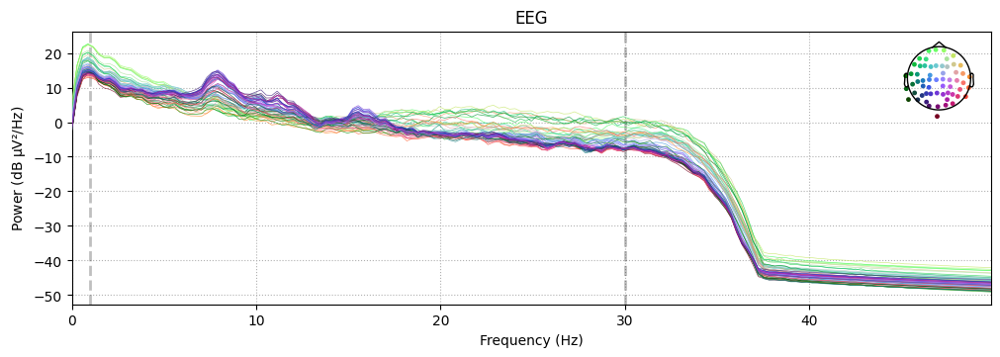

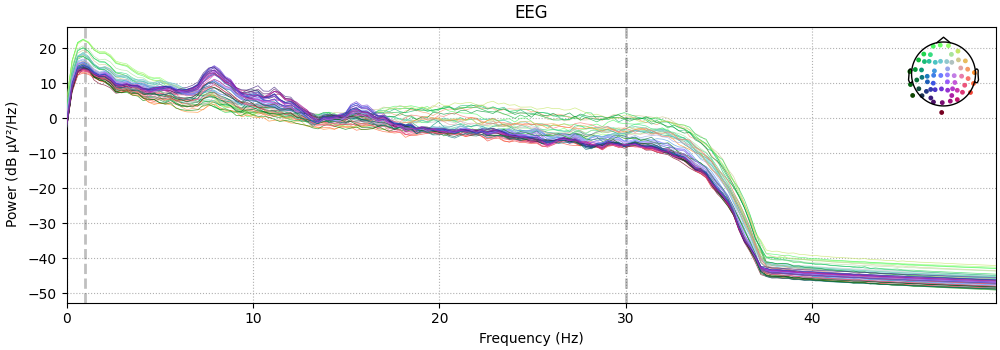

In [28]:
# Apply a Filter and test
raw_low = raw_eeg.copy().filter(l_freq=None, h_freq=30)  # Low-pass filter below 30 Hz
# We put .copy because MNE objects inherit their properties and if we do not copy the data structure we can over write the data

# View the PSD
raw_low.plot_psd(fmax=50)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1983 samples (3.302 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 3.410 (s)
Plotting power spectral density (dB=True).


<ipython-input-29-accf7de3d0ab>:4: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  raw_high.plot_psd(fmax=50)


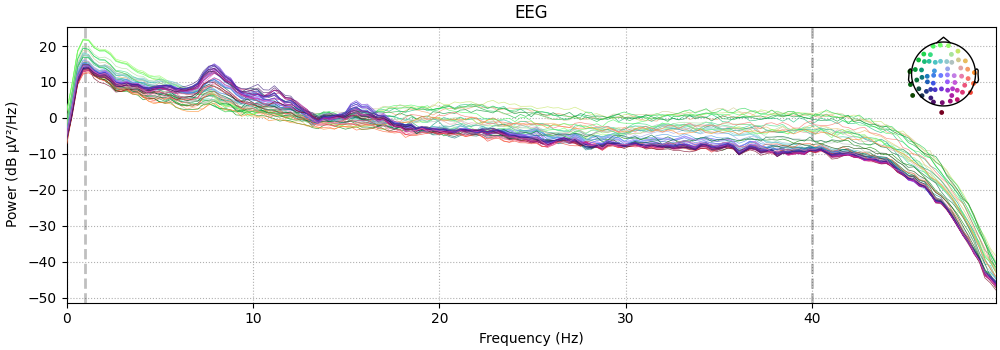

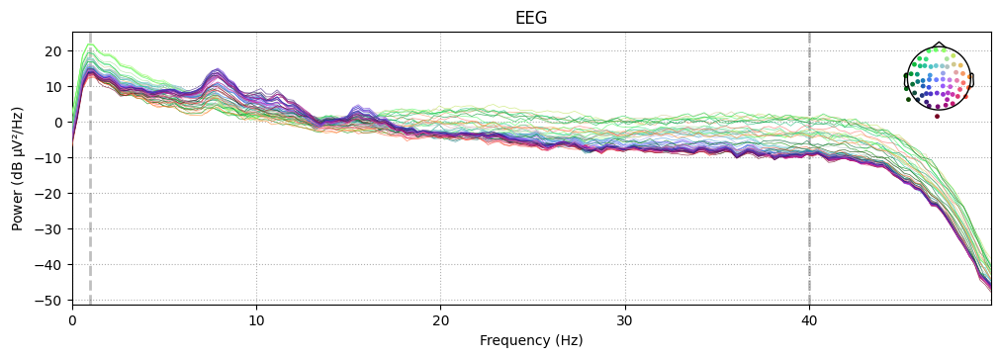

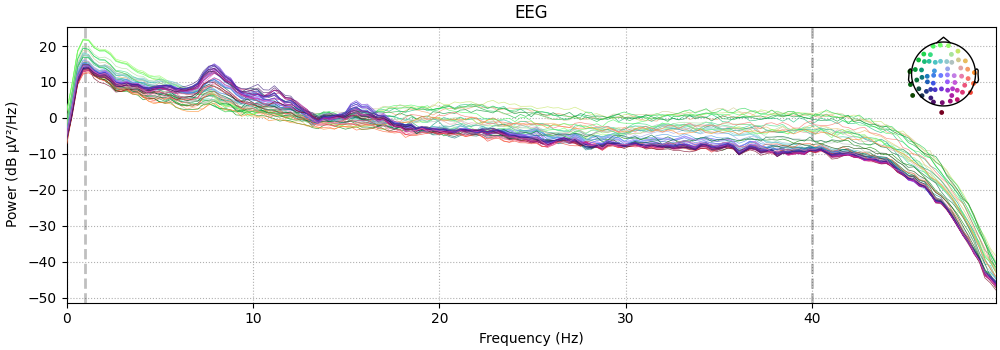

In [29]:
raw_high = raw_eeg.copy().filter(l_freq=1, h_freq=None)  # High-pass filter above 1 Hz

#View the PSD
raw_high.plot_psd(fmax=50)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 19 - 21 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 19.45
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 19.20 Hz)
- Upper passband edge: 20.55 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 20.80 Hz)
- Filter length: 3965 samples (6.602 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 3.410 (s)
Plotting power spectral density (dB=True).


<ipython-input-32-411da9a7986b>:3: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  raw_notch.plot_psd(fmax=50)


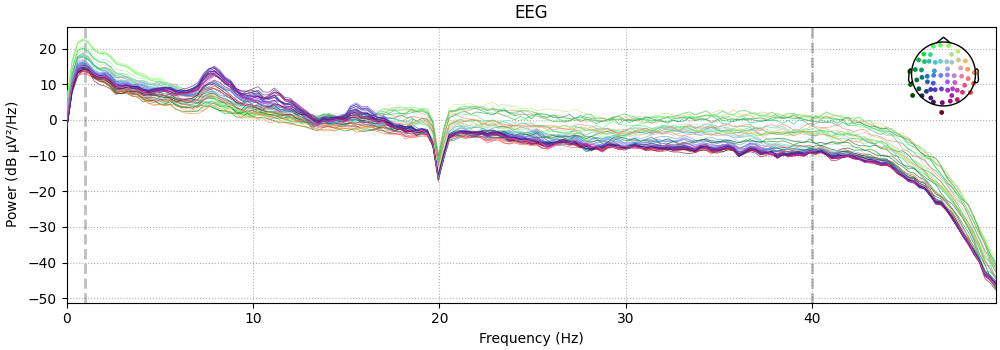

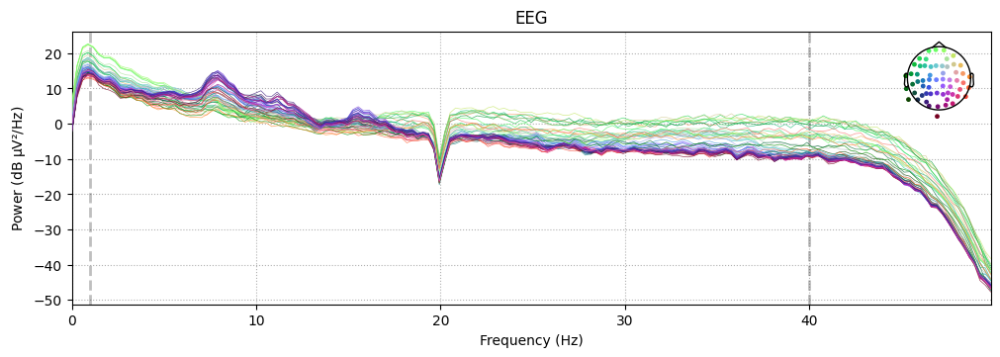

In [ ]:
raw_notch = raw_eeg.copy().notch_filter(freqs=[20])  # Notch filter at 50 Hz and 60 Hz

raw_notch.plot_psd(fmax=50)

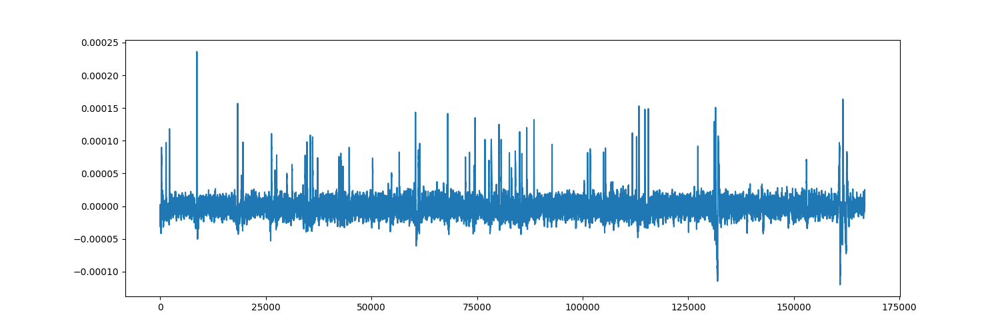

In [31]:
# Let's look at an individua channel and individual signal.
plt.figure(figsize=(15,5))
plt.plot(raw_eeg['EEG 001'][0][0])
plt.show()

In [36]:
# Above we see the visual of pulling a single time series

# we can index, or select, channels by their name like;
ex_chan = raw_eeg['EEG 001'][0][0]
print(ex_chan) # is now an array of the values,

# TO inspect how many data points are in this single time series
len(ex_chan) # There are 166,800 points.

[ 5.92923063e-21 -4.85711465e-06 -9.33118135e-06 ...  2.91692654e-06
  1.52163548e-06 -1.69406589e-21]


166800

In [46]:
# Now that we have the ammount of data points, let's see if we can figure out how long in real time the data is

# Time = data points / sampling frequency
sfreq = raw_eeg.info["sfreq"]

print(f"Sampling frequency: {sfreq:.2f}")

time = len(ex_chan) /sfreq

#print(time)
print(f"Time Length = Data Points/Hz = Data Points/1/Time = Data Point Time")
print(f"{time:.2f} seconds = {time/60:.2f} minutes")

Sampling frequency: 600.61
Time Length = Data Points/Hz = Data Points/1/Time = Data Point Time
277.72 seconds = 4.63 minutes


In [48]:
# We can also just pull the data from the MNE data structure into an array
raw_data = raw_eeg.get_data()

# Lets see the size (Channels, Time points)
print(raw_data.shape)

(59, 166800)


In [74]:
# This method of choosing channels is called slicing, : is like ..., and the number is the start or stop,
print(raw_data[:3, :10].shape)
print(raw_data[15:, 100:-10].shape)

(3, 10)
(44, 166690)


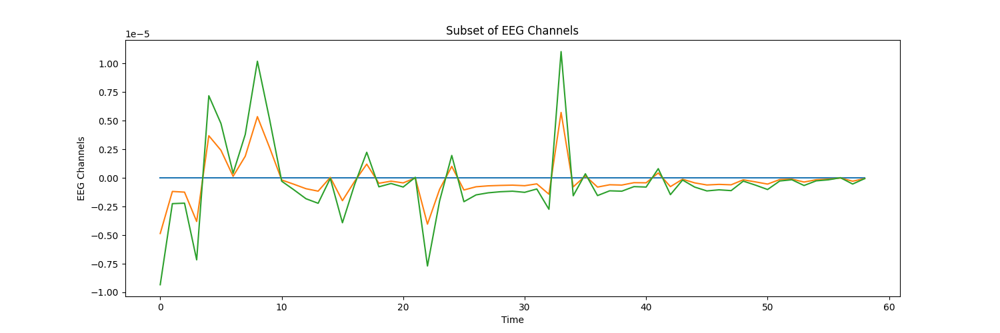

In [95]:
# Let's plot a subset of the EEG channels and a subset of the recording
plt.figure(figsize=(15,5))
plt.plot(raw_data[:100,:3]) # This method of choosing channels is called slicing, Coordinates are rerverses ! Inspect why
plt.xlabel("Time")
plt.ylabel("EEG Channels")
plt.title("Subset of EEG Channels")
plt.show()

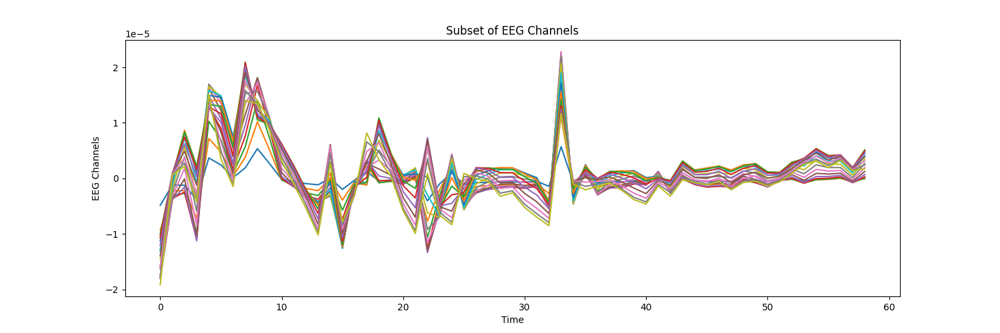

In [98]:
# Let's plot a subset of the EEG channels, 20 channels and only 100 data points
plt.figure(figsize=(15,5))
plt.plot(raw_data[:1000,1:20]) # This method of choosing channels is called slicing,
plt.xlabel("Time")
plt.ylabel("EEG Channels")
plt.title("Subset of EEG Channels")
plt.show()

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 40.960 (s)
Plotting power spectral density (dB=True).


<ipython-input-82-d7e6b7fbbed9>:7: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  raw_eeg_downsampled.plot_psd()


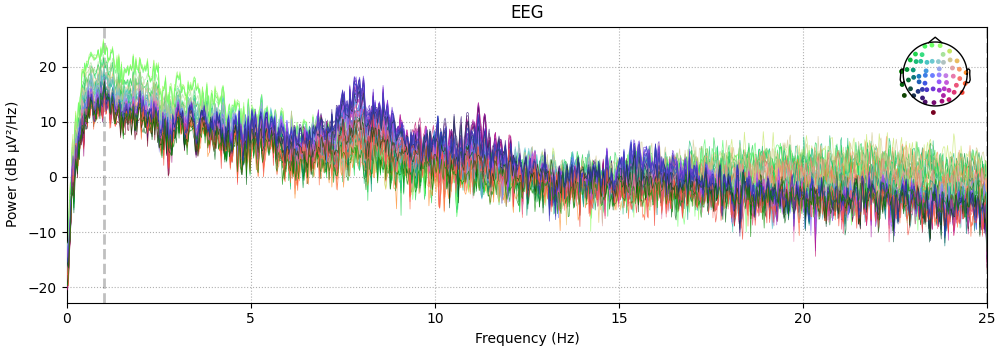

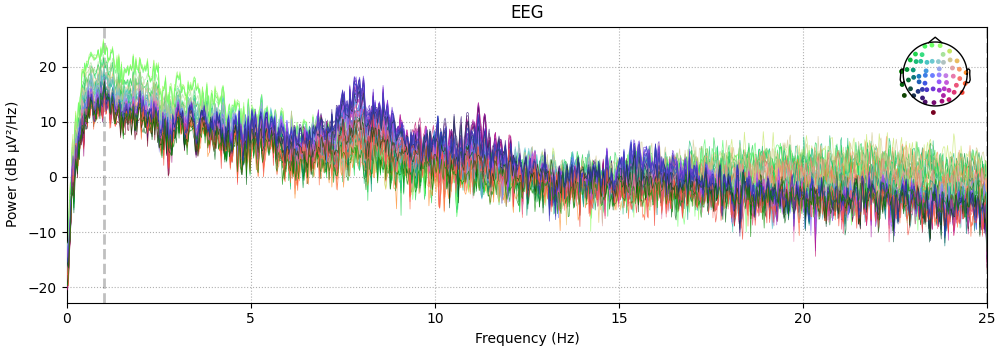

In [82]:
# We can see the above took a long time, this is because there are so many data points, for most analyses we do not need this high temporal resolution
# We can downsample the data, which is in essence averaging across points.

# we will use the resample method and go from 600Hz to 100Hz
raw_eeg_downsampled = raw_eeg.resample(sfreq=50)

raw_eeg_downsampled.plot_psd()
plt.show()

In [87]:
# Pull the data form the MNE data structure
raw_eeg_downsampled_data = raw_eeg_downsampled.get_data() # Pull the data form the MNE data structure
raw_eeg_downsampled_data.shape

(59, 13886)

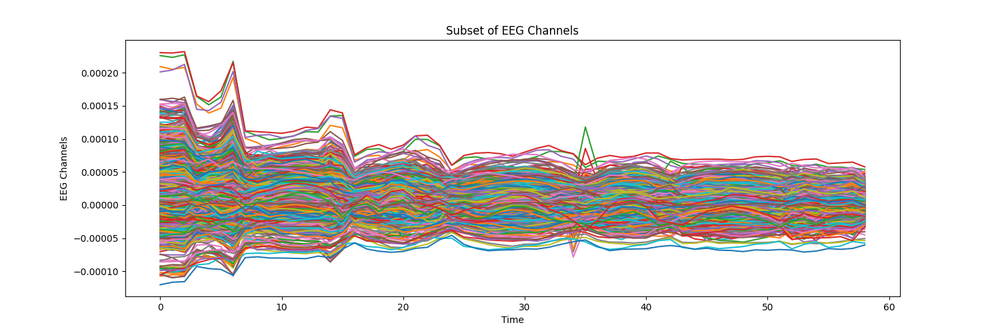

In [101]:
# Let's plot a subset of the EEG channels and a subset of the recording

plt.figure(figsize=(15,5))
plt.plot(raw_eeg_downsampled_data[:,:1]) # This method of choosing channels is called slicing,
plt.xlabel("Time")
plt.ylabel("EEG Channels")
plt.title("Subset of EEG Channels")
plt.show()

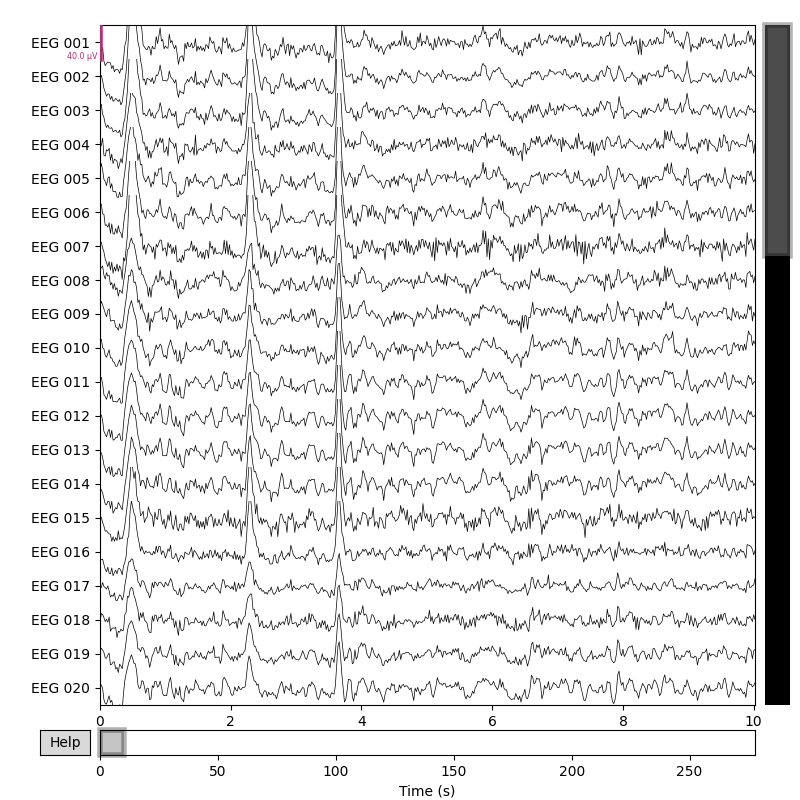

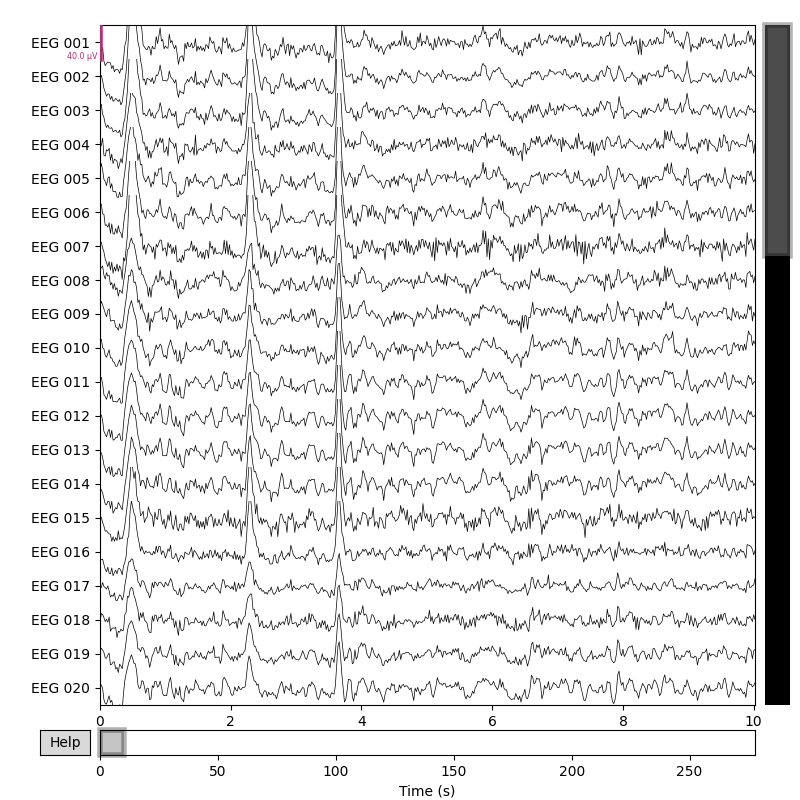

In [102]:
raw_eeg.plot() # We can also select attributes of this funciton like: n_channels=10, start=0, duration=5
plt.show()

We have explored:
1. The MNE and Python environment,
2. Loading and playing data structures with sample data from MNE
3. How to plot time domain and frequency domain information through time series and PSD
4. Different filtering techniques were explored
5. Resampling of the data.

Next,

We will explroe cleaning and excluding bad channels
We will explore the fourier transform
Spectogram time-frequency domain
COnvolution, autocorrelaiton

Preprocessing pipeline

Metric exploration.

In [ ]:
# Optionally, mark identified bad channels
raw.info['bads'] = ['EEG 053']  # Example bad channels

#We have now set in the metadata of the file structure to store the bad eeg channel so it will not be displayed

In [ ]:
# Periodiogram and spectrogram
# Time frequency vs freuncy vs time plots
# tie vs spectral analysis
# Types of noise, gaussian, ....
# Aperiodic activiyt,
# Aperiodic slope, hurst exponents.
# COnvolution, Autocorrelation.

In [ ]:
# ICA, FIlters, FIR IIR, Canonical bands
#